In [1]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
import datetime

from sklearn.model_selection import train_test_split
from sklearn.metrics import accuracy_score
import tensorflow as tf
from tensorflow.keras import models, layers
from tensorflow.keras.preprocessing import image
from tensorflow.keras.preprocessing.image import ImageDataGenerator
from tensorflow.keras.callbacks import ModelCheckpoint, EarlyStopping, ReduceLROnPlateau
from tensorflow.keras.applications import EfficientNetB0
from tensorflow.keras.optimizers import Adam

# ignoring warnings
import warnings
warnings.simplefilter("ignore")

import os, cv2, json
from PIL import Image

In [ ]:
WORK_DIR = "C:\\Users\\berki\\OneDrive\\Desktop\\ITU_CS\\ComputerVision\\cassava_leaf_disease"
LABEL_MAP_FILE = os.path.join(WORK_DIR, "label_num_to_disease_map.json")
TRAIN_FILE = os.path.join(WORK_DIR, "train.csv")
TRAIN_IMAGES_DIR = os.path.join(WORK_DIR, "train_images")


In [39]:
# Count the total number of image files in the TRAIN_IMAGES_DIR
image_files = [file for file in os.listdir(TRAIN_IMAGES_DIR) if os.path.isfile(os.path.join(TRAIN_IMAGES_DIR, file))]
print(f"Total number of training images: {len(image_files)}")


Total number of training images: 21397


In [40]:
# Load the class labels from label_num_to_disease_map.json
with open(LABEL_MAP_FILE, 'r') as file:
    label_map = json.load(file)

# Print the class list
print("Class list from label_num_to_disease_map.json:")
for label, class_name in label_map.items():
    print(f"Label {label}: {class_name}")


Class list from label_num_to_disease_map.json:
Label 0: Cassava Bacterial Blight (CBB)
Label 1: Cassava Brown Streak Disease (CBSD)
Label 2: Cassava Green Mottle (CGM)
Label 3: Cassava Mosaic Disease (CMD)
Label 4: Healthy


In [41]:
train_data = pd.read_csv(os.path.join(WORK_DIR, "train.csv"))
train_data.head(10)

,image_id,label
0,1000015157.jpg,0
1,1000201771.jpg,3
2,100042118.jpg,1
3,1000723321.jpg,1
4,1000812911.jpg,3
5,1000837476.jpg,3
6,1000910826.jpg,2
7,1001320321.jpg,0
8,1001723730.jpg,4
9,1001742395.jpg,3


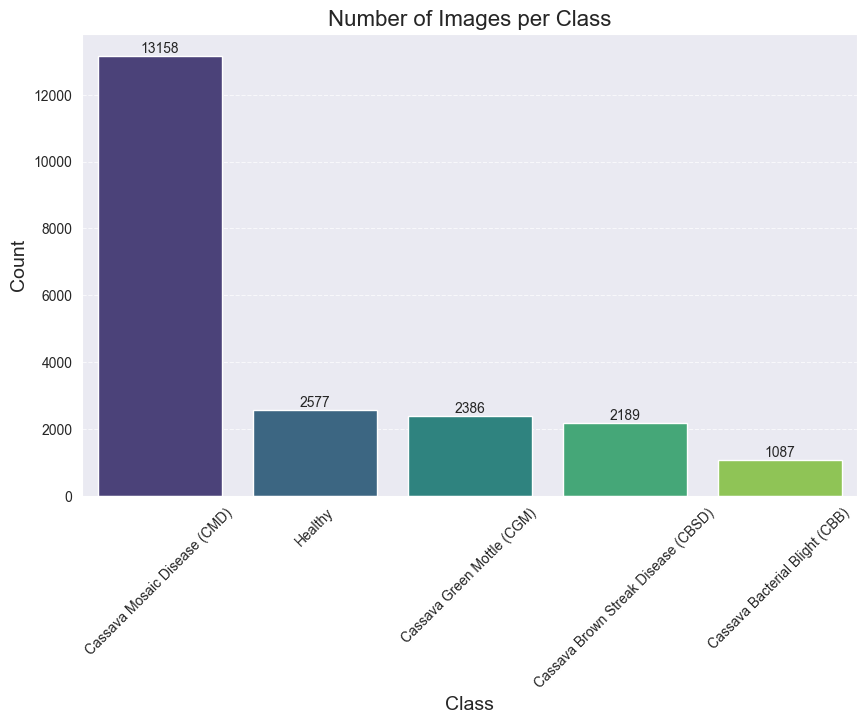

In [42]:


# Dosya yollarını tanımlayın
WORK_DIR = "C:\\Users\\berki\\OneDrive\\Desktop\\ITU_CS\\ComputerVision\\cassava_leaf_disease"
LABEL_MAP_FILE = os.path.join(WORK_DIR, "label_num_to_disease_map.json")
TRAIN_FILE = os.path.join(WORK_DIR, "train.csv")

# Veriyi yükleme
train_data = pd.read_csv(TRAIN_FILE)

# Etiketlerin anlamlarını yükleme ve anahtarları tam sayıya dönüştürme
with open(LABEL_MAP_FILE, 'r') as file:
    label_map = {int(k): v for k, v in json.load(file).items()}

# Sınıf etiketlerini sınıf isimlerine eşleme
train_data['class_name'] = train_data['label'].map(label_map)

# Her sınıftaki görsel sayısını hesaplama
class_counts = train_data['class_name'].value_counts()
# Updated bar chart with counts
plt.figure(figsize=(10, 6))
barplot = sns.barplot(x=class_counts.index, y=class_counts.values, palette='viridis')
plt.title('Number of Images per Class', fontsize=16)
plt.xlabel('Class', fontsize=14)
plt.ylabel('Count', fontsize=14)
plt.xticks(rotation=45)
plt.grid(axis='y', linestyle='--', alpha=0.7)

# Add counts above bars
for i, count in enumerate(class_counts.values):
    barplot.text(i, count + 100, str(count), ha='center', fontsize=10)

plt.show()



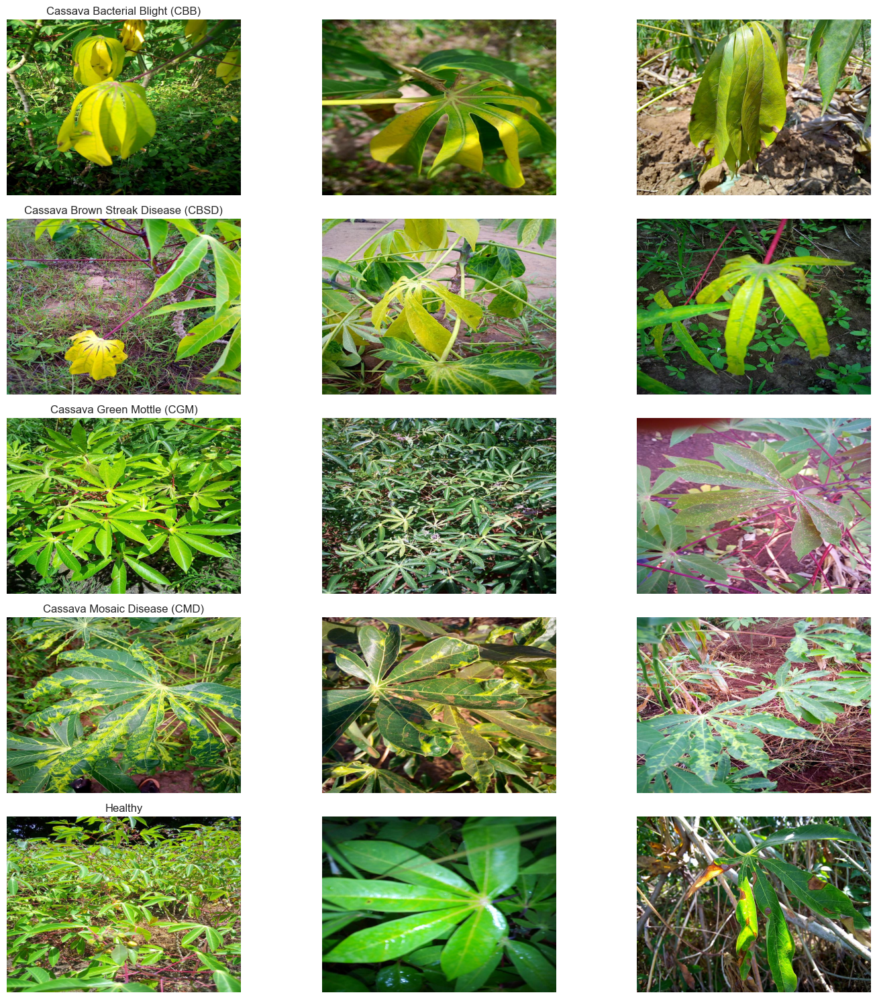

In [43]:
import matplotlib.pyplot as plt
from PIL import Image
import os

# Number of examples per class
examples_per_class = 3

# Group images by class and sample
sampled_images = train_data.groupby('label').apply(
    lambda x: x.sample(n=examples_per_class, random_state=42)
).reset_index(drop=True)

# Plotting the images
fig, axes = plt.subplots(len(label_map), examples_per_class, figsize=(15, 15))

for i, (label, group) in enumerate(sampled_images.groupby('label')):
    class_name = label_map[label]
    for j, (_, row) in enumerate(group.iterrows()):
        img_path = os.path.join(TRAIN_IMAGES_DIR, row['image_id'])
        img = Image.open(img_path)
        axes[i, j].imshow(img)
        axes[i, j].axis('off')
        if j == 0:
            axes[i, j].set_title(class_name, fontsize=12)

plt.tight_layout()
plt.show()


In [44]:
# Main parameters
BATCH_SIZE = 4
STEPS_PER_EPOCH = int(len(train_data)*0.8 / BATCH_SIZE)
VALIDATION_STEPS = int(len(train_data)*0.2 / BATCH_SIZE)
EPOCHS = 5
TARGET_SIZE = 512


In [45]:
from tensorflow.keras.preprocessing.image import ImageDataGenerator

# Ensure labels are strings
train_data['label'] = train_data['label'].astype('str')

# ImageDataGenerator for training data
train_datagen = ImageDataGenerator(
    validation_split=0.2,
    preprocessing_function=None,  # Add a preprocessing function if needed (e.g., tf.keras.applications.efficientnet.preprocess_input)
    rotation_range=45,
    zoom_range=0.2,
    horizontal_flip=True,
    vertical_flip=True,
    fill_mode='nearest',
    shear_range=0.1,
    height_shift_range=0.1,
    width_shift_range=0.1
)

# Training data generator
train_generator = train_datagen.flow_from_dataframe(
    dataframe=train_data,
    directory=TRAIN_IMAGES_DIR,
    subset="training",
    x_col="image_id",
    y_col="label",
    target_size=(TARGET_SIZE, TARGET_SIZE),
    batch_size=BATCH_SIZE,
    class_mode="sparse"
)

# ImageDataGenerator for validation data
validation_datagen = ImageDataGenerator(validation_split=0.2)

# Validation data generator
validation_generator = validation_datagen.flow_from_dataframe(
    dataframe=train_data,
    directory=TRAIN_IMAGES_DIR,
    subset="validation",
    x_col="image_id",
    y_col="label",
    target_size=(TARGET_SIZE, TARGET_SIZE),
    batch_size=BATCH_SIZE,
    class_mode="sparse"
)


Found 17118 validated image filenames belonging to 5 classes.
Found 4279 validated image filenames belonging to 5 classes.


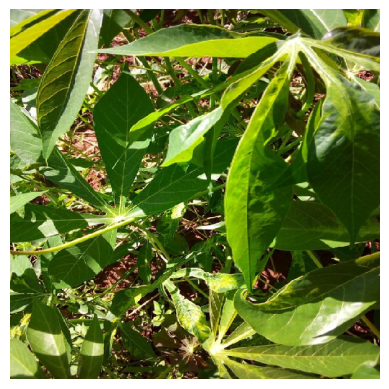

In [46]:
img_path = os.path.join(WORK_DIR, "train_images", train_data.image_id[50])
img = image.load_img(img_path, target_size = (TARGET_SIZE, TARGET_SIZE))
img_tensor = image.img_to_array(img)
img_tensor = np.expand_dims(img_tensor, axis = 0)
img_tensor /= 255.

plt.imshow(img_tensor[0])
plt.axis('off')
plt.show()

Found 1 validated image filenames belonging to 1 classes.


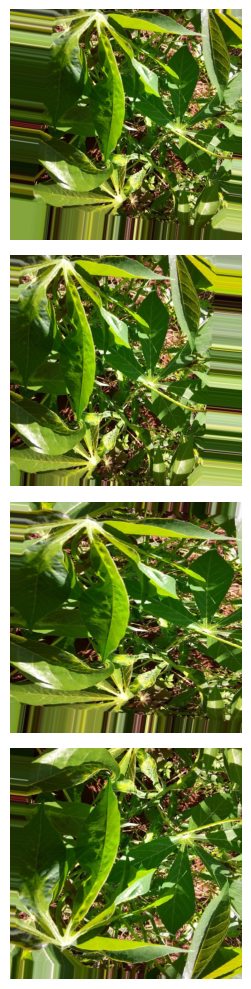

In [47]:
generator = train_datagen.flow_from_dataframe(train_data.iloc[50:51],
                         directory = os.path.join(WORK_DIR, "train_images"),
                         x_col = "image_id",
                         y_col = "label",
                         target_size = (TARGET_SIZE, TARGET_SIZE),
                         batch_size = BATCH_SIZE,
                         class_mode = "sparse")

aug_images = [generator[0][0][0]/255 for i in range(10)]
fig, axes = plt.subplots(4, 1, figsize = (20, 10))
axes = axes.flatten()
for img, ax in zip(aug_images, axes):
    ax.imshow(img)
    ax.axis('off')
plt.tight_layout()
plt.show()

In [48]:
def create_model():
    conv_base = EfficientNetB0(include_top = False, weights = None,
                               input_shape = (TARGET_SIZE, TARGET_SIZE, 3))
    model = conv_base.output
    model = layers.GlobalAveragePooling2D()(model)
    model = layers.Dense(5, activation = "softmax")(model)
    model = models.Model(conv_base.input, model)

    model.compile(optimizer = Adam(learning_rate = 0.001),
                  loss = "sparse_categorical_crossentropy",
                  metrics = ["acc"])
    return model

In [49]:
model = create_model()
model.summary()

Model: "model_2"
__________________________________________________________________________________________________
 Layer (type)                   Output Shape         Param #     Connected to                     
 input_3 (InputLayer)           [(None, 512, 512, 3  0           []                               
                                )]                                                                
                                                                                                  
 rescaling_2 (Rescaling)        (None, 512, 512, 3)  0           ['input_3[0][0]']                
                                                                                                  
 normalization_2 (Normalization  (None, 512, 512, 3)  7          ['rescaling_2[0][0]']            
 )                                                                                                
                                                                                            

In [50]:
print('Our EfficientNet CNN has %d layers' %len(model.layers))

Our EfficientNet CNN has 239 layers


In [51]:
model.load_weights('C:\\Users\\berki\\OneDrive\\Desktop\\ITU_CS\\ComputerVision\\cassava_leaf_disease\\archive\\basic_EfNetB0_imagenet_512.h5')

In [52]:
model_save = ModelCheckpoint('./EffNetB0_512_8_best_weights.weights.h5',
                             save_best_only = True,
                             save_weights_only = True,
                             monitor = 'val_loss',
                             mode = 'min', verbose = 1)
early_stop = EarlyStopping(monitor = 'val_loss', min_delta = 0.001,
                           patience = 5, mode = 'min', verbose = 1,
                           restore_best_weights = True)
reduce_lr = ReduceLROnPlateau(monitor = 'val_loss', factor = 0.3,
                              patience = 2, min_delta = 0.001,
                              mode = 'min', verbose = 1)


history = model.fit(
    train_generator,
    steps_per_epoch = STEPS_PER_EPOCH,
    epochs = EPOCHS,
    validation_data = validation_generator,
    validation_steps = VALIDATION_STEPS,
    callbacks = [model_save, early_stop, reduce_lr]
)

Epoch 1/5
4279/4279 [==============================] - ETA: 0s - loss: 0.7533 - acc: 0.7344
Epoch 1: val_loss improved from inf to 1.24167, saving model to .\EffNetB0_512_8_best_weights.weights.h5
4279/4279 [==============================] - 1023s 237ms/step - loss: 0.7533 - acc: 0.7344 - val_loss: 1.2417 - val_acc: 0.5655 - lr: 0.0010
Epoch 2/5
4279/4279 [==============================] - ETA: 0s - loss: 0.5866 - acc: 0.7980
Epoch 2: val_loss improved from 1.24167 to 0.58964, saving model to .\EffNetB0_512_8_best_weights.weights.h5
4279/4279 [==============================] - 947s 221ms/step - loss: 0.5866 - acc: 0.7980 - val_loss: 0.5896 - val_acc: 0.8038 - lr: 0.0010
Epoch 3/5
4279/4279 [==============================] - ETA: 0s - loss: 0.5432 - acc: 0.8100
Epoch 3: val_loss improved from 0.58964 to 0.54629, saving model to .\EffNetB0_512_8_best_weights.weights.h5
4279/4279 [==============================] - 950s 222ms/step - loss: 0.5432 - acc: 0.8100 - val_loss: 0.5463 - val_acc: 

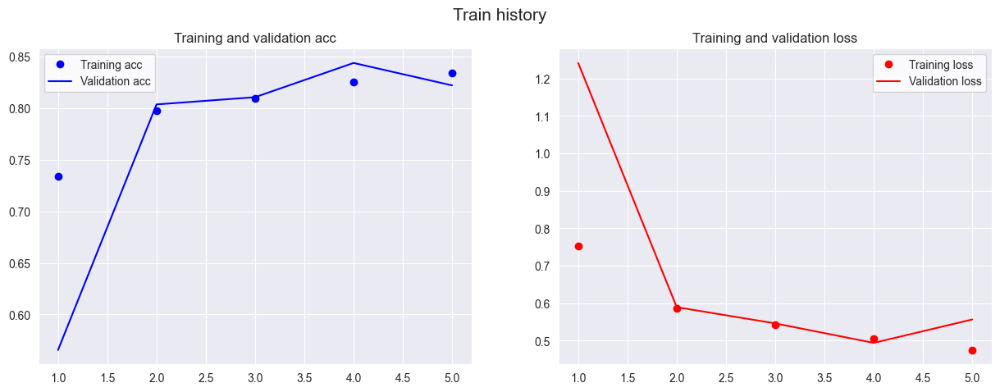

In [53]:
acc = history.history['acc']
val_acc = history.history['val_acc']
loss = history.history['loss']
val_loss = history.history['val_loss']

epochs = range(1, len(acc) + 1)

fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(15, 5))
sns.set_style("white")
plt.suptitle('Train history', size = 15)

ax1.plot(epochs, acc, "bo", label = "Training acc")
ax1.plot(epochs, val_acc, "b", label = "Validation acc")
ax1.set_title("Training and validation acc")
ax1.legend()

ax2.plot(epochs, loss, "bo", label = "Training loss", color = 'red')
ax2.plot(epochs, val_loss, "b", label = "Validation loss", color = 'red')
ax2.set_title("Training and validation loss")
ax2.legend()

plt.show()

In [54]:
def activation_layer_vis(img, activation_layer = 0, layers = 10):
    layer_outputs = [layer.output for layer in model.layers[:layers]]
    activation_model = models.Model(inputs = model.input, outputs = layer_outputs)
    activations = activation_model.predict(img)

    rows = int(activations[activation_layer].shape[3] / 3)
    cols = int(activations[activation_layer].shape[3] / rows)
    fig, axes = plt.subplots(rows, cols, figsize = (15, 15 * cols))
    axes = axes.flatten()

    for i, ax in zip(range(activations[activation_layer].shape[3]), axes):
        ax.matshow(activations[activation_layer][0, :, :, i], cmap = 'viridis')
        ax.axis('off')
    plt.tight_layout()
    plt.show()

1/1 [==============================] - 1s 987ms/step


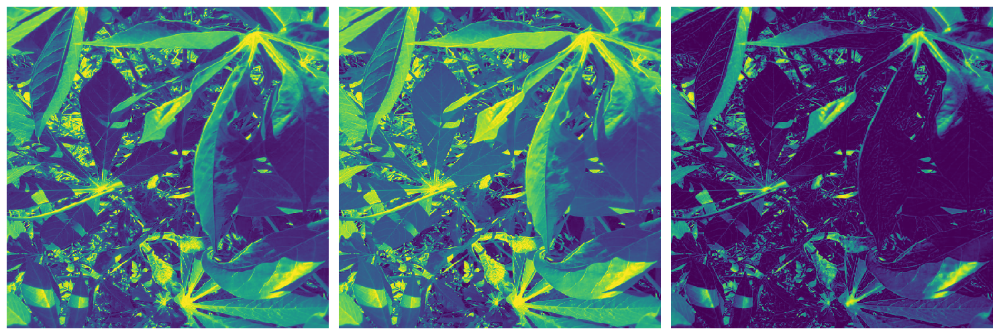

In [55]:
activation_layer_vis(img_tensor, 0)

In [56]:
def all_activations_vis(img, layers = 10):
    layer_outputs = [layer.output for layer in model.layers[:layers]]
    activation_model = models.Model(inputs = model.input, outputs = layer_outputs)
    activations = activation_model.predict(img)

    layer_names = []
    for layer in model.layers[:layers]:
        layer_names.append(layer.name)

    images_per_row = 3
    for layer_name, layer_activation in zip(layer_names, activations):
        n_features = layer_activation.shape[-1]

        size = layer_activation.shape[1]

        n_cols = n_features // images_per_row
        display_grid = np.zeros((size * n_cols, images_per_row * size))

        for col in range(n_cols):
            for row in range(images_per_row):
                channel_image = layer_activation[0, :, :, col * images_per_row + row]
                channel_image -= channel_image.mean()
                channel_image /= channel_image.std()
                channel_image *= 64
                channel_image += 128
                channel_image = np.clip(channel_image, 0, 255).astype('uint8')
                display_grid[col * size : (col + 1) * size,
                             row * size : (row + 1) * size] = channel_image
        scale = 1. / size
        plt.figure(figsize=(scale * 5 * display_grid.shape[1],
                            scale * 5 * display_grid.shape[0]))
        plt.title(layer_name)
        plt.grid(False)
        plt.axis('off')
        plt.imshow(display_grid, aspect = 'auto', cmap = 'viridis')

1/1 [==============================] - 0s 50ms/step


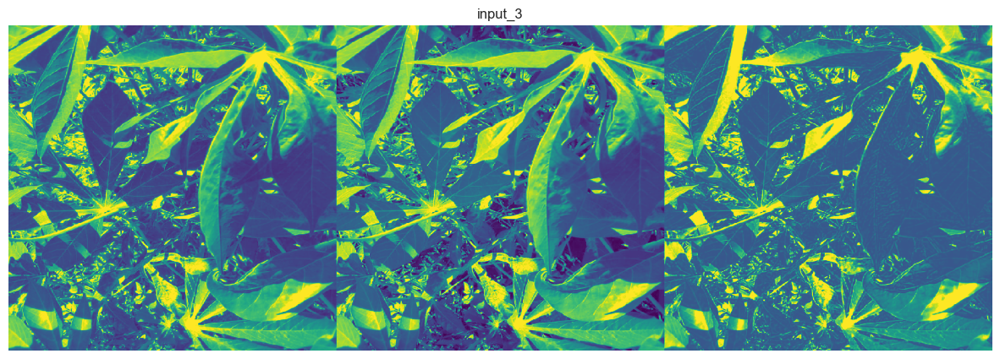

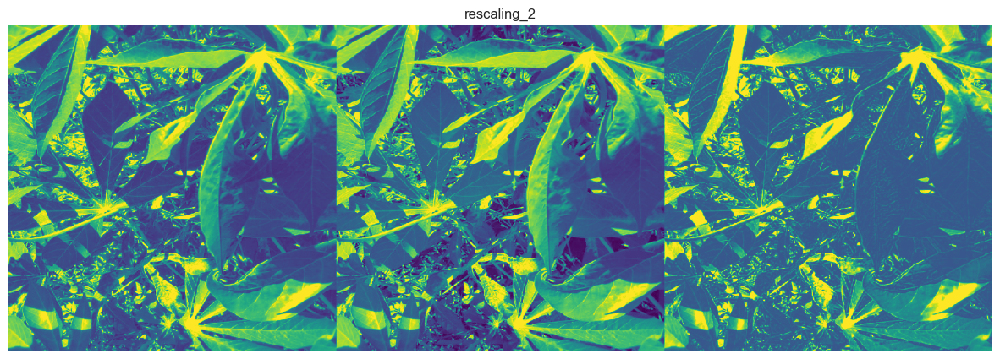

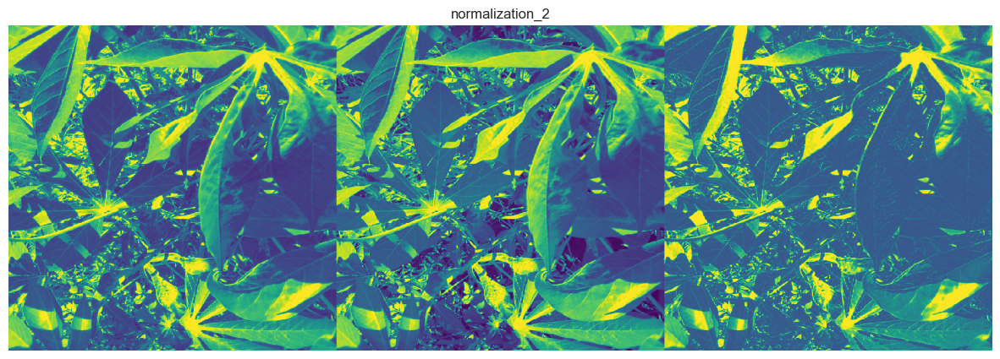

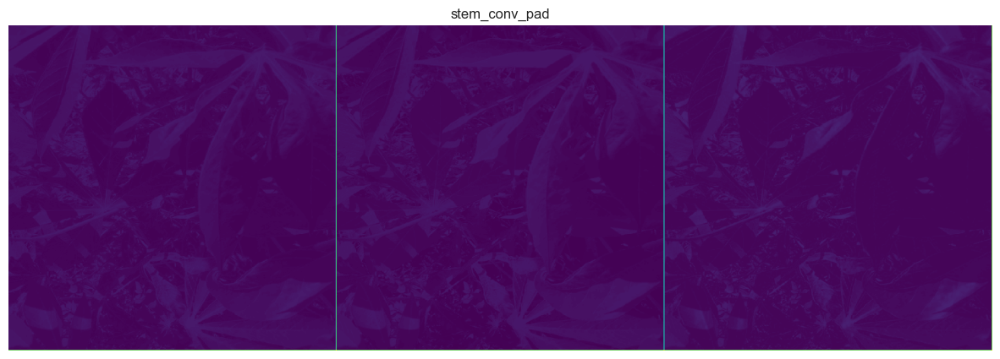

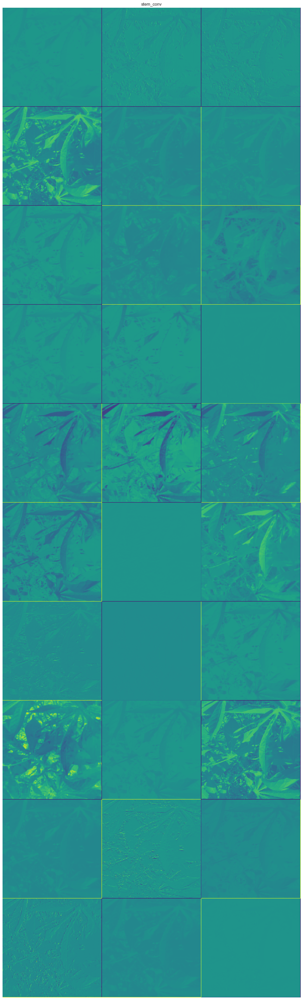

In [57]:
all_activations_vis(img_tensor, 5)

In [60]:
ss = pd.read_csv(os.path.join(WORK_DIR, "sample_submission.csv"))
ss

,image_id,label
0,2216849948.jpg,4


In [61]:
preds = []

for image_id in ss.image_id:
    image = Image.open(os.path.join(WORK_DIR,  "test_images", image_id))
    image = image.resize((TARGET_SIZE, TARGET_SIZE))
    image = np.expand_dims(image, axis = 0)
    preds.append(np.argmax(model.predict(image)))

ss['label'] = preds
ss

1/1 [==============================] - 2s 2s/step


,image_id,label
0,2216849948.jpg,4
